Goal here is to detect keypoints on a single image by looking at their descriptor


Imports


In [1]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
import os
import sys

# add the path to the visualize_hessian folder
sys.path.append(os.path.join("..", "visualize_hessian"))

import visu_hessian as vh

# return to the root directory
sys.path.append(os.path.join(".."))

# add the path to the visualize_hessian folder
sys.path.append(os.path.join("..", "descriptor"))

import descriptor.descriptor as desc
import descriptor.visu_descriptor as visu_desc

# return to the root directory
sys.path.append(os.path.join(".."))

# Load grayscale image


In [2]:
img_folder = "../data/irl/scene_zipped"
im_name1 = "scene_l_1_u"
im_name2 = "scene_r_1_u"
im_names = [im_name1, im_name2]
im_ext = "jpeg"

ims = [
    cv.imread(f"{img_folder}/{im_names[i]}.{im_ext}", cv.IMREAD_GRAYSCALE)
    for i in range(2)
]

In [3]:
# compute float32 versions for calculations
float_ims = [vh.convert_uint8_to_float32(ims[i]) for i in range(2)]

## Crop object


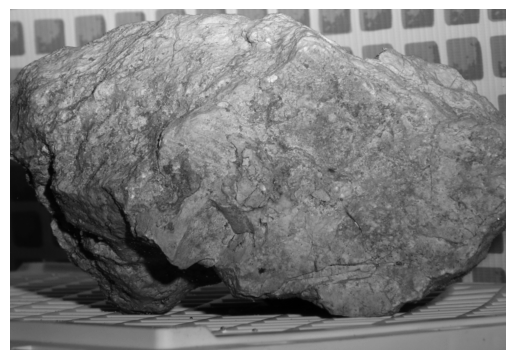

Image 1 min: 0.027450980618596077
Image 1 max: 0.886274516582489
Image 1 mean: 0.4154772460460663
Image 1 std: 0.1569676250219345
Image 1 shape: (900, 1310)
Image 1 dtype: float32
Image 1 size: 1179000

Image 2 min: 0.0470588244497776
Image 2 max: 0.9058823585510254
Image 2 mean: 0.43415072560310364
Image 2 std: 0.16003815829753876
Image 2 shape: (890, 1410)
Image 2 dtype: float32
Image 2 size: 1254900



In [4]:
croppings = [slice(500, 1400), slice(900, 2210), slice(670, 1560), slice(1090, 2500)]

# crop subimage around the object


obj_ims = [
    float_ims[0][croppings[0], croppings[1]],
    float_ims[1][croppings[2], croppings[3]],
]
# also crop uint images to apply sift
obj_uint_ims = [
    ims[0][croppings[0], croppings[1]],
    ims[1][croppings[2], croppings[3]],
]



plt.imshow(obj_ims[0], cmap="gray")


plt.axis("off")


plt.show()



# print statistics


for i, im in enumerate(obj_ims):
    print(f"Image {i+1} min: {im.min()}")

    print(f"Image {i+1} max: {im.max()}")

    print(f"Image {i+1} mean: {im.mean()}")

    print(f"Image {i+1} std: {im.std()}")

    print(f"Image {i+1} shape: {im.shape}")

    print(f"Image {i+1} dtype: {im.dtype}")

    print(f"Image {i+1} size: {im.size}")
    print("")

Blur images


In [5]:
blur_sigma = 1.0
obj_ims = [desc.convolve_2D_gaussian(obj_ims[i], blur_sigma) for i in range(2)]

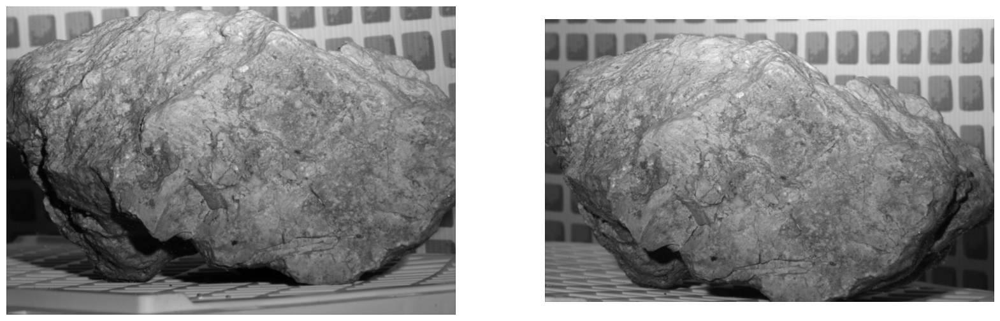

In [6]:
# compute min and max values for normalization
min_val = min(obj_ims[0].min(), obj_ims[1].min())
max_val = max(obj_ims[0].max(), obj_ims[1].max())
min_vals, max_vals = [min_val, min_val], [max_val, max_val]

plt.figure(figsize=(20, 10))
plt.subplot(1, 2, 1)
plt.imshow(obj_ims[0], cmap="gray", vmin=min_val, vmax=max_val)
plt.axis("off")
plt.subplot(1, 2, 2)
plt.imshow(obj_ims[1], cmap="gray", vmin=min_val, vmax=max_val)
plt.axis("off")
plt.show()

## Detect "good" keypoints


Find the keypoints with thresholds on characteristics


In [7]:
obj_features = [
    desc.compute_features_overall_abs(obj_ims[i], border_size=1) for i in range(2)
]

_Observations:_

- 3'17" compute time for 900x1310 image
- 5'30" compute time for 2 ~900x1310 images


In [8]:
len(obj_features[0]), len(obj_features[1])

(4, 4)

In [9]:
# define descriptor parameter
nb_bins = 3
bin_radius = 2
delta_angle = 5.0
nb_angular_bins = int(360 / delta_angle) + 1
sigma_weight = 0
normalization_mode = "global"
descriptor_size = 3 * nb_bins * nb_bins * nb_angular_bins

# define where to compute descriptor, depends on the size of the descriptor neighborhood
neighborhood_width = nb_bins * (2 * bin_radius + 1)
neighborhood_radius = neighborhood_width // 2
border_size = neighborhood_radius + 1

y_starts = [border_size, border_size]
y_stops = [obj_ims[i].shape[0] - border_size for i in range(2)]
x_starts = [border_size, border_size]
x_stops = [obj_ims[i].shape[1] - border_size for i in range(2)]

# initialize descriptor array, coordinates are in the whole object image
descs_objs = [
    [
        [None for j in range(obj_ims[id_image].shape[1])]
        for i in range(obj_ims[id_image].shape[0])
    ]
    for id_image in range(2)
]

In [10]:
print("y_starts", y_starts)
print("y_stops", y_stops)
print("x_starts", x_starts)
print("x_stops", x_stops)

y_starts [8, 8]
y_stops [892, 882]
x_starts [8, 8]
x_stops [1302, 1402]


Find thresholds to prefilter pixels


In [11]:
_, abs_eigvals1, gradients_norms1, _ = obj_features[0]
_, abs_eigvals2, gradients_norms2, _ = obj_features[1]
abs_eigvals = [abs_eigvals1, abs_eigvals2]
gradients_norms = [gradients_norms1, gradients_norms2]


# print statistics about the eigenvalues and gradients
print(f"Eigenvalues min: {abs_eigvals[0].min()}, {abs_eigvals[1].min()}")
print(f"Eigenvalues max: {abs_eigvals[0].max()}, {abs_eigvals[1].max()}")
print(f"Eigenvalues mean: {abs_eigvals[0].mean()}, {abs_eigvals[1].mean()}")
print(f"Eigenvalues std: {abs_eigvals[0].std()}, {abs_eigvals[1].std()}")
print(f"Eigenvalues shape: {abs_eigvals[0].shape}, {abs_eigvals[1].shape}")
print(f"Eigenvalues dtype: {abs_eigvals[0].dtype}, {abs_eigvals[1].dtype}")
print(f"Eigenvalues size: {abs_eigvals[0].size}, {abs_eigvals[1].size}")
print("")

print(f"Gradients min: {gradients_norms[0].min()}, {gradients_norms[1].min()}")
print(f"Gradients max: {gradients_norms[0].max()}, {gradients_norms[1].max()}")
print(f"Gradients mean: {gradients_norms[0].mean()}, {gradients_norms[1].mean()}")
print(f"Gradients std: {gradients_norms[0].std()}, {gradients_norms[1].std()}")
print(f"Gradients shape: {gradients_norms[0].shape}, {gradients_norms[1].shape}")
print(f"Gradients dtype: {gradients_norms[0].dtype}, {gradients_norms[1].dtype}")
print(f"Gradients size: {gradients_norms[0].size}, {gradients_norms[1].size}")

Eigenvalues min: 0.0, 0.0
Eigenvalues max: 0.18820549547672272, 0.17694489657878876
Eigenvalues mean: 0.008368929848074913, 0.007840758189558983
Eigenvalues std: 0.010055054910480976, 0.009652502834796906
Eigenvalues shape: (900, 1310, 2), (890, 1410, 2)
Eigenvalues dtype: float32, float32
Eigenvalues size: 2358000, 2509800

Gradients min: 0.0, 0.0
Gradients max: 0.36431822180747986, 0.3214843273162842
Gradients mean: 0.03314467892050743, 0.03089120052754879
Gradients std: 0.027770698070526123, 0.02621268294751644
Gradients shape: (900, 1310), (890, 1410)
Gradients dtype: float32, float32
Gradients size: 1179000, 1254900


Define thresholds for gradient norm and curvature absolute value


In [12]:
grad_norm_threshs = [gradients_norms[id_image].max() * 0.0 for id_image in range(2)]
curv_threshs = [
    [abs_eigvals[id_image][:, :, eigval_id].max() * 0.4 for eigval_id in range(2)]
    for id_image in range(2)
]

print(f"Gradient norm threshold: {grad_norm_threshs}")
print(f"Curvature thresholds: {curv_threshs}")

Gradient norm threshold: [0.0, 0.0]
Curvature thresholds: [[0.04913148283958435, 0.0752821981906891], [0.055528610944747925, 0.07077795863151551]]


Compute descriptors of selected keypoints


In [13]:
selected_keypoints = [
    np.zeros((obj_ims[id_image].shape[0], obj_ims[id_image].shape[1]), dtype=bool)
    for id_image in range(2)
]



for id_image in range(2):
    for i in range(y_starts[id_image], y_stops[id_image]):
        for j in range(x_starts[id_image], x_stops[id_image]):
            # check if pixels chars pass thresholds


            # pixels indices are in the whole image


            is_accepted = gradients_norms[id_image][i, j] > grad_norm_threshs[
                id_image
            ] and all(
                abs_eigvals[id_image][i, j, eigval_id]
                > curv_threshs[id_image][eigval_id]
                for eigval_id in range(2)
            )


            if is_accepted:
                selected_keypoints[id_image][i, j] = True


                print(f"Accepted pixel in image number {id_image} at ({i}, {j})")


                raw_desc = desc.compute_descriptor_histograms_1_2_rotated(
                    obj_features[id_image],
                    (j, i),
                    nb_bins,
                    bin_radius,
                    delta_angle,

                    sigma_weight,
                    normalization_mode,
                )


                flat_desc = desc.flatten_descriptor(raw_desc)


                descs_objs[id_image][i][j] = flat_desc

Accepted pixel in image number 0 at (91, 633)
Accepted pixel in image number 0 at (91, 634)
Accepted pixel in image number 0 at (103, 985)
Accepted pixel in image number 0 at (103, 986)
Accepted pixel in image number 0 at (237, 708)
Accepted pixel in image number 0 at (250, 410)
Accepted pixel in image number 0 at (269, 647)
Accepted pixel in image number 0 at (362, 113)
Accepted pixel in image number 0 at (368, 389)
Accepted pixel in image number 0 at (422, 391)
Accepted pixel in image number 0 at (452, 392)
Accepted pixel in image number 0 at (457, 698)
Accepted pixel in image number 0 at (457, 699)
Accepted pixel in image number 0 at (464, 414)
Accepted pixel in image number 0 at (496, 796)
Accepted pixel in image number 0 at (553, 1289)
Accepted pixel in image number 0 at (553, 1290)
Accepted pixel in image number 0 at (554, 1289)
Accepted pixel in image number 0 at (554, 1290)
Accepted pixel in image number 0 at (563, 911)
Accepted pixel in image number 0 at (669, 1027)
Accepted p

In [14]:
nb_selected_keypoints = [
    sum(sum(selected_keypoints[id_image])) for id_image in range(2)
]
print(f"Number of selected pixels: {nb_selected_keypoints}")

Number of selected pixels: [26, 18]


In [56]:
# from boolean mask create list of pixel coordinates
selected_keypoints_coords = [
    np.argwhere(selected_keypoints[id_image]) for id_image in range(2)
]

print("Selected keypoints in left image")
print(selected_keypoints_coords[0])
print("Selected keypoints in right image")
print(selected_keypoints_coords[1])

Selected keypoints in left image
[[  91  633]
 [  91  634]
 [ 103  985]
 [ 103  986]
 [ 237  708]
 [ 250  410]
 [ 269  647]
 [ 362  113]
 [ 368  389]
 [ 422  391]
 [ 452  392]
 [ 457  698]
 [ 457  699]
 [ 464  414]
 [ 496  796]
 [ 553 1289]
 [ 553 1290]
 [ 554 1289]
 [ 554 1290]
 [ 563  911]
 [ 669 1027]
 [ 670 1027]
 [ 765  411]
 [ 802  361]
 [ 803  361]
 [ 803  362]]
Selected keypoints in right image
[[ 182  973]
 [ 323  560]
 [ 457  338]
 [ 487  286]
 [ 503  961]
 [ 518  584]
 [ 519  584]
 [ 580  764]
 [ 618 1193]
 [ 671 1174]
 [ 672 1174]
 [ 672 1175]
 [ 673 1174]
 [ 767  898]
 [ 768  898]
 [ 809  374]
 [ 809  375]
 [ 844  341]]


Display found keypoints on object image


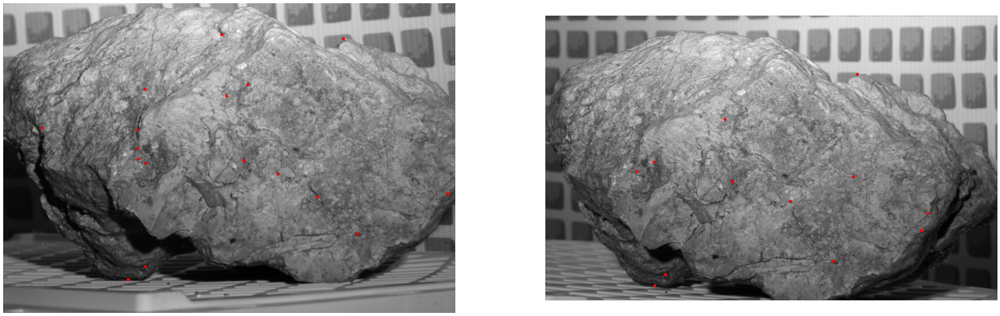

In [15]:
point_size = 30  # Define point size. You can adjust this as needed.

fig, axs = plt.subplots(
    1, 2, figsize=(40, 20)
)  # Create a subplot with 1 row and 2 columns

# Plot the first image
axs[0].imshow(obj_ims[0], cmap="gray")
axs[0].axis("off")
axs[0].scatter(
    np.where(selected_keypoints[0])[1],
    np.where(selected_keypoints[0])[0],
    c="r",
    s=point_size,
)

# Plot the second image
axs[1].imshow(obj_ims[1], cmap="gray")
axs[1].axis("off")
axs[1].scatter(
    np.where(selected_keypoints[1])[1],
    np.where(selected_keypoints[1])[0],
    c="r",
    s=point_size,
)

plt.show()

_Selection results:_

- threshold on curvature: 0.3 \* max for each
  - nb selected keypoints (left, right) = 175, 112 in 30"
- threshold on curvature: 0.4 \* max for each
  - nb selected keypoints (left, right) = 26, 18 in 10"

_Observations:_

- Some prefiltered keypoints seem to represent the same real point


### Compute baseline


Take the n closest match given by sift


In [16]:
import cv2 as cv
import matplotlib.pyplot as plt

# Initiate SIFT detector
sift = cv.SIFT_create()

# find the keypoints and descriptors with SIFT
kps, des = [None, None], [None, None]
kps[0], des[0] = sift.detectAndCompute(obj_uint_ims[0], None)
kps[1], des[1] = sift.detectAndCompute(obj_uint_ims[1], None)

# print number of keypoints detected in each image
for i in range(2):
    print(f"Number of keypoints detected in image {i+1}: {len(kps[i])}")

# BFMatcher with default params
bf = cv.BFMatcher()
matches = bf.knnMatch(des[0], des[1], k=2)

# Apply ratio test
good = []
for m, n in matches:
    if m.distance < 0.75 * n.distance:
        good.append([m])

# Sort them in the order of their distance.
good_sorted = sorted(good, key=lambda x: x[0].distance)

# Print the 10 best matches
print("10 best matches:")
for i in range(10):
    print(f"Match {i+1}: {good_sorted[i][0].distance}")

Number of keypoints detected in image 1: 7366
Number of keypoints detected in image 2: 6916
10 best matches:
Match 1: 31.11269760131836
Match 2: 33.808284759521484
Match 3: 35.1425666809082
Match 4: 35.7071418762207
Match 5: 36.359317779541016
Match 6: 36.37306594848633
Match 7: 38.57460403442383
Match 8: 41.364234924316406
Match 9: 42.76681137084961
Match 10: 45.35416030883789


Display as much sift matches as prefiltered keypoints, sorted by increasing distance between their descriptors


Number of matches to display: 18


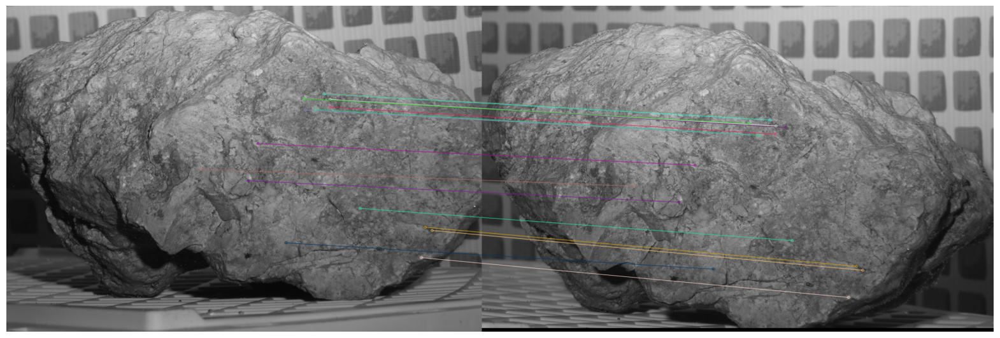

In [17]:
# Draw only the best matches
nb_matches_to_display = min(nb_selected_keypoints)
print(f"Number of matches to display: {nb_matches_to_display}")

best_matches = good_sorted[:nb_matches_to_display]

img3 = cv.drawMatchesKnn(
    obj_uint_ims[0],
    kps[0],
    obj_uint_ims[1],
    kps[1],
    best_matches,
    outImg=None,
    flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS,
)

plt.figure(figsize=(20, 10))
plt.imshow(img3)
plt.axis("off")
plt.show()

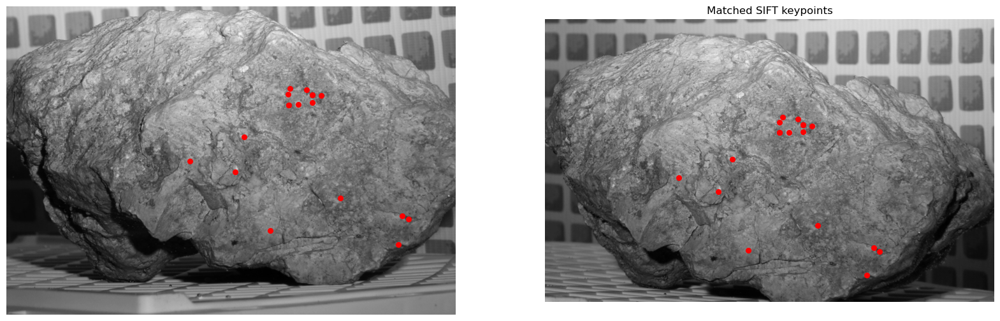

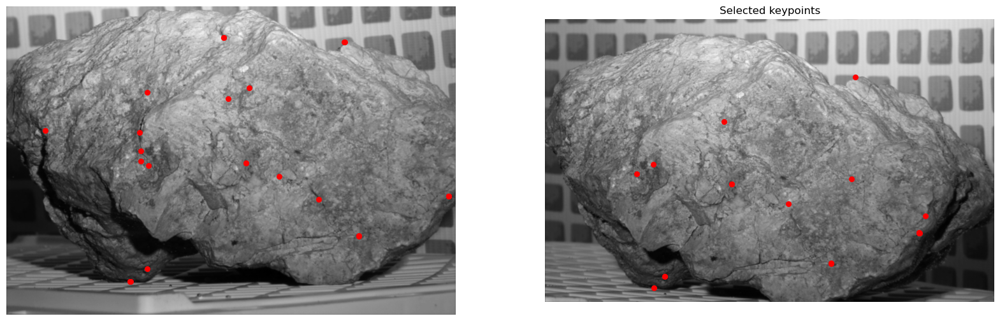

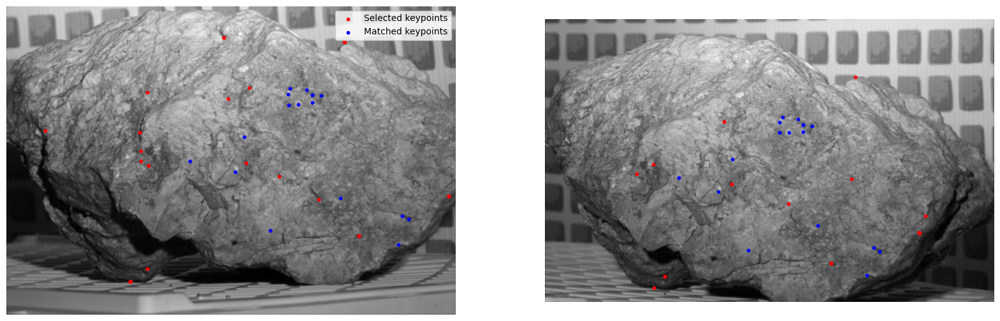

In [18]:
# display the matched  SIFT keypoints
plt.figure(figsize=(20, 10))
plt.subplot(1, 2, 1)
plt.imshow(obj_uint_ims[0], cmap="gray")
plt.axis("off")
plt.scatter(
    [kps[0][m[0].queryIdx].pt[0] for m in best_matches],
    [kps[0][m[0].queryIdx].pt[1] for m in best_matches],
    c="r",
    s=point_size,
)
plt.subplot(1, 2, 2)
plt.imshow(obj_uint_ims[1], cmap="gray")
plt.axis("off")
plt.scatter(
    [kps[1][m[0].trainIdx].pt[0] for m in best_matches],
    [kps[1][m[0].trainIdx].pt[1] for m in best_matches],
    c="r",
    s=point_size,
)
plt.title("Matched SIFT keypoints")
plt.show()

# display again the selected keypoints
plt.figure(figsize=(20, 10))
plt.subplot(1, 2, 1)
plt.imshow(obj_ims[0], cmap="gray")
plt.axis("off")
plt.scatter(
    np.where(selected_keypoints[0])[1],
    np.where(selected_keypoints[0])[0],
    c="r",
    s=point_size,
)
plt.subplot(1, 2, 2)
plt.imshow(obj_ims[1], cmap="gray")
plt.axis("off")
plt.scatter(
    np.where(selected_keypoints[1])[1],
    np.where(selected_keypoints[1])[0],
    c="r",
    s=point_size,
)
plt.title("Selected keypoints")
plt.show()

# display on the same image the selected keypoints and the matched SIFT keypoints
point_size = 10
plt.figure(figsize=(20, 10))
plt.subplot(1, 2, 1)
plt.imshow(obj_ims[0], cmap="gray")
plt.axis("off")
plt.scatter(
    np.where(selected_keypoints[0])[1],
    np.where(selected_keypoints[0])[0],
    c="r",
    s=point_size,
)
plt.scatter(
    [kps[0][m[0].queryIdx].pt[0] for m in best_matches],
    [kps[0][m[0].queryIdx].pt[1] for m in best_matches],
    c="b",
    s=point_size,
)
plt.subplot(1, 2, 2)
plt.imshow(obj_ims[1], cmap="gray")
plt.axis("off")
plt.scatter(
    np.where(selected_keypoints[1])[1],
    np.where(selected_keypoints[1])[0],
    c="r",
    s=point_size,
)
plt.scatter(
    [kps[1][m[0].trainIdx].pt[0] for m in best_matches],
    [kps[1][m[0].trainIdx].pt[1] for m in best_matches],
    c="b",
    s=point_size,
)
# add legend between the two images
plt.subplot(1, 2, 1)
plt.scatter([], [], c="r", s=point_size, label="Selected keypoints")
plt.scatter([], [], c="b", s=point_size, label="Matched keypoints")
plt.legend()
plt.show()

_Observations:_

- as expected, selected keypoints are not that close to SIFT matched keypoints


In [ ]:
# compute coordinates of selected keypoints in left image

### Analyze descriptor of selected Keypoints


In [19]:
# compute all distances between the flat descriptors of the selected keypoints
# indices pairs are a list of tuples of coordinates (x, y) as in opencv
all_distances = []
all_indices = []

# loop 1 over selected keypoints in the left image
for i in range(y_starts[0], y_stops[0]):
    for j in range(x_starts[0], x_stops[0]):
        if selected_keypoints[0][i, j]:
            # loop 2 over selected keypoints in the right image
            for k in range(y_starts[1], y_stops[1]):
                for l in range(x_starts[1], x_stops[1]):
                    if selected_keypoints[1][k, l]:
                        # compute the distance between the two descriptors
                        distance = desc.compute_descriptor_distance(
                            descs_objs[0][i][j], descs_objs[1][k][l]
                        )

                        # store distance and indices
                        all_distances.append(distance)
                        all_indices.append([(j, i), (l, k)])

# # loop 1 over selected keypoints in the left image
# for i in range(y_starts[0], y_stops[0]):
#     for j in range(x_starts[0], x_stops[0]):
#         if selected_keypoints[0][i, j]:
#             # initialize coordinates of the best match in the right image
#             best_match = None
#             best_distance = None

#             # loop 2 over selected keypoints in the right image
#             for k in range(y_starts[1], y_stops[1]):
#                 for l in range(x_starts[1], x_stops[1]):
#                     if selected_keypoints[1][k, l]:
#                         # compute the distance between the two descriptors
#                         distance_candidate = desc.compute_descriptor_distance(
#                             descs_objs[0][i][j], descs_objs[1][k][l]
#                         )

#                         # update the best match if needed
#                         # coordinates are (x, y) as in opencv
#                         if best_distance is None or distance_candidate < best_distance:
#                             best_distance = distance_candidate
#                             best_match = (l, k)

#             # store the best distance and best match
#             all_distances.append(best_distance)
#             all_indices.append([(j, i), best_match])

In [20]:
# sort distances and indices by increasing distance
all_distances_sorted, all_indices_sorted = zip(*sorted(zip(all_distances, all_indices)))

In [21]:
# print distances
print("Distances:")
for i in range(len(all_distances_sorted)):
    print(f"Distance {i+1}: {all_distances_sorted[i]}")
    print(f"Indices {i+1}: {all_indices_sorted[i]}")

Distances:
Distance 1: 22.20130157470703
Indices 1: [(410, 250), (961, 503)]
Distance 2: 22.888673782348633
Indices 2: [(392, 452), (961, 503)]
Distance 3: 23.159147262573242
Indices 3: [(414, 464), (961, 503)]
Distance 4: 23.36083984375
Indices 4: [(410, 250), (286, 487)]
Distance 5: 23.543682098388672
Indices 5: [(647, 269), (961, 503)]
Distance 6: 23.623441696166992
Indices 6: [(414, 464), (764, 580)]
Distance 7: 23.838590621948242
Indices 7: [(391, 422), (961, 503)]
Distance 8: 23.847517013549805
Indices 8: [(410, 250), (584, 519)]
Distance 9: 24.018827438354492
Indices 9: [(414, 464), (286, 487)]
Distance 10: 24.243024826049805
Indices 10: [(698, 457), (584, 519)]
Distance 11: 24.256179809570312
Indices 11: [(392, 452), (584, 519)]
Distance 12: 24.370332717895508
Indices 12: [(796, 496), (338, 457)]
Distance 13: 24.471328735351562
Indices 13: [(708, 237), (961, 503)]
Distance 14: 24.710350036621094
Indices 14: [(698, 457), (961, 503)]
Distance 15: 24.758256912231445
Indices 15: [(

In [24]:
# loop over all matches and for each keypoint of the right image, keep only the best match, ie the first match, because distances are sorted
# best_matches_distances = []
# best_matches_indices = []

# seen_right_kps = set()

# for id_match in range(len(all_distances_sorted)):
#     right_kp = all_indices_sorted[id_match][1]
#     # check if the right keypoint has already been seen
#     if right_kp in seen_right_kps:
#         continue
#     else:
#         # add the right keypoint to the set of seen keypoints
#         seen_right_kps.add(right_kp)
#         # store the match
#         best_matches_distances.append(all_distances_sorted[id_match])
#         best_matches_indices.append(all_indices_sorted[id_match])

# print("Best unique matches:")
# for i in range(len(best_matches_distances)):
#     print(f"Distance {i+1}: {best_matches_distances[i]}")
#     print(f"Indices {i+1}: {best_matches_indices[i]}")

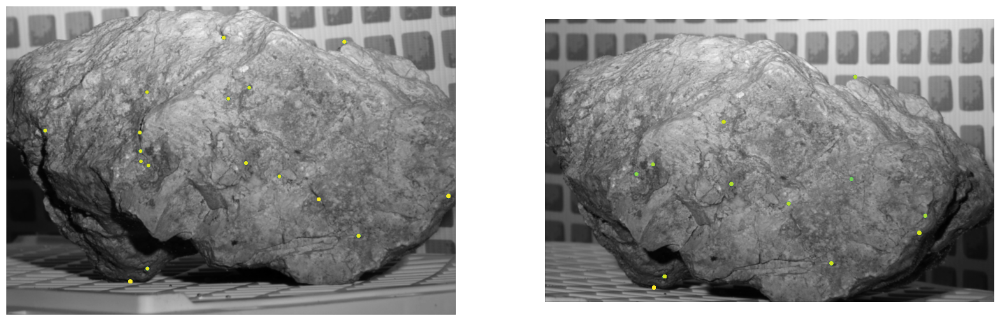

In [25]:
nb_matches_to_display = len(all_indices_sorted)
# display the best matches with unique colors
plt.figure(figsize=(20, 10))
plt.subplot(1, 2, 1)
plt.imshow(obj_ims[0], cmap="gray")
plt.axis("off")
plt.scatter(
    [all_indices_sorted[i][0][0] for i in range(nb_matches_to_display)],
    [all_indices_sorted[i][0][1] for i in range(nb_matches_to_display)],
    c=np.arange(nb_matches_to_display),
    s=point_size,
)
plt.subplot(1, 2, 2)
plt.imshow(obj_ims[1], cmap="gray")
plt.axis("off")
plt.scatter(
    [all_indices_sorted[i][1][0] for i in range(nb_matches_to_display)],
    [all_indices_sorted[i][1][1] for i in range(nb_matches_to_display)],
    c=np.arange(nb_matches_to_display),
    s=point_size,
)
plt.show()

# nb_matches_to_display = len(best_matches_indices)
# # display the best matches with unique colors
# plt.figure(figsize=(20, 10))
# plt.subplot(1, 2, 1)
# plt.imshow(obj_ims[0], cmap="gray")
# plt.axis("off")
# plt.scatter(
#     [best_matches_indices[i][0][0] for i in range(nb_matches_to_display)],
#     [best_matches_indices[i][0][1] for i in range(nb_matches_to_display)],
#     c=np.arange(nb_matches_to_display),
#     s=point_size,
# )
# plt.subplot(1, 2, 2)
# plt.imshow(obj_ims[1], cmap="gray")
# plt.axis("off")
# plt.scatter(
#     [best_matches_indices[i][1][0] for i in range(nb_matches_to_display)],
#     [best_matches_indices[i][1][1] for i in range(nb_matches_to_display)],
#     c=np.arange(nb_matches_to_display),
#     s=point_size,
# )
# plt.show()

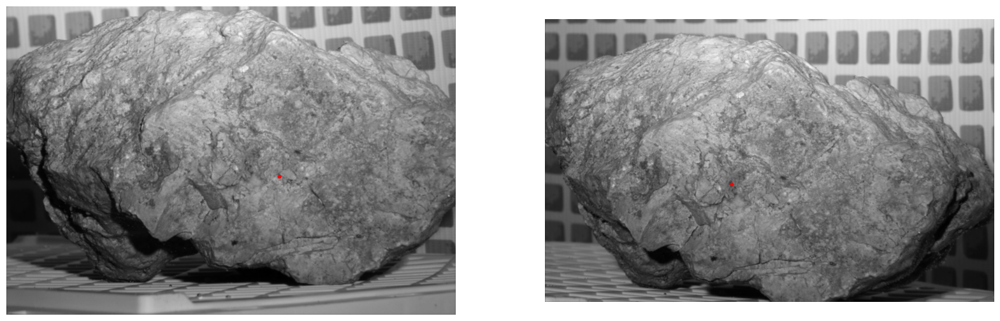

In [54]:
# display random match
id_match = 50

# create keypoint object with coordinates
chosen_kps = [
    cv.KeyPoint(
        all_indices_sorted[id_match][id_image][0],
        all_indices_sorted[id_match][id_image][1],
        size=1,
    )
    for id_image in range(2)
]

plt.figure(figsize=(20, 10))
plt.subplot(1, 2, 1)
plt.imshow(obj_ims[0], cmap="gray")
plt.axis("off")
plt.scatter(
    chosen_kps[0].pt[0],
    chosen_kps[0].pt[1],
    c="r",
    s=point_size,
)
plt.subplot(1, 2, 2)
plt.imshow(obj_ims[1], cmap="gray")
plt.axis("off")
plt.scatter(
    chosen_kps[1].pt[0],
    chosen_kps[1].pt[1],
    c="r",
    s=point_size,
)
plt.show()

_Observations:_

- Eventhough descriptors distances are low, lots of matched keypoint do not represent same real keypoint. We still hope that restraining the scope of the search to subimages will enhance result.


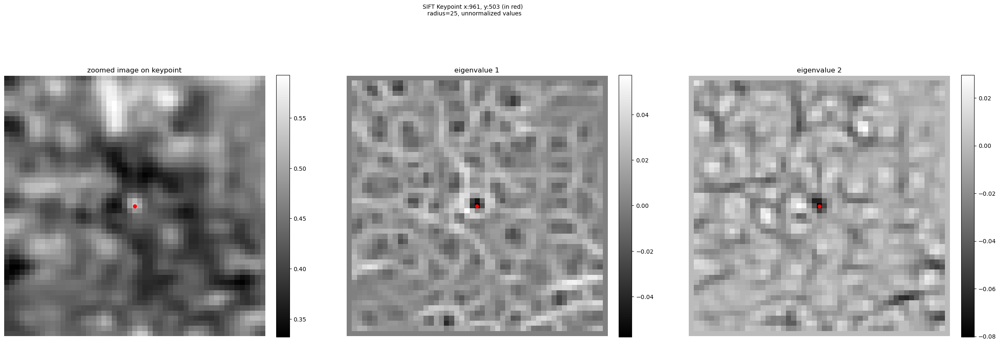

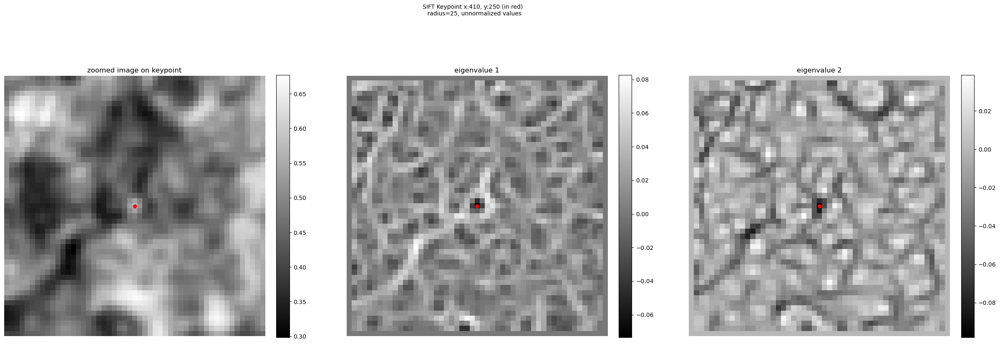

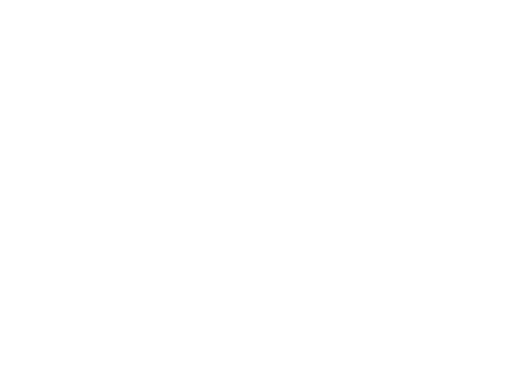

In [41]:
# display curvature values
zoom_radius = 25
fig_size = (30, 10)
figs = [
    vh.visualize_curvature_values(
        obj_ims[id_image],
        chosen_kps[id_image],
        zoom_radius,
        figsize=fig_size,
    )
    for id_image in range(2)
]

for id_image in range(2):
    plt.figure(figs[id_image].number)
    plt.axis("off")
    plt.show()

In [42]:
# display principal directions
dir_fig = vh.compare_directions(
    obj_ims[0], obj_ims[1], chosen_kps[0], chosen_kps[1], zoom_radius, dpi=800
)

# show figure
plt.figure(dir_fig.number)
plt.show()

In [43]:
# display gradients
grad_fig = vh.compare_gradients(
    obj_ims[0], obj_ims[1], chosen_kps[0], chosen_kps[1], zoom_radius, dpi=800
)

# show figure
plt.figure(grad_fig.number)
plt.show()

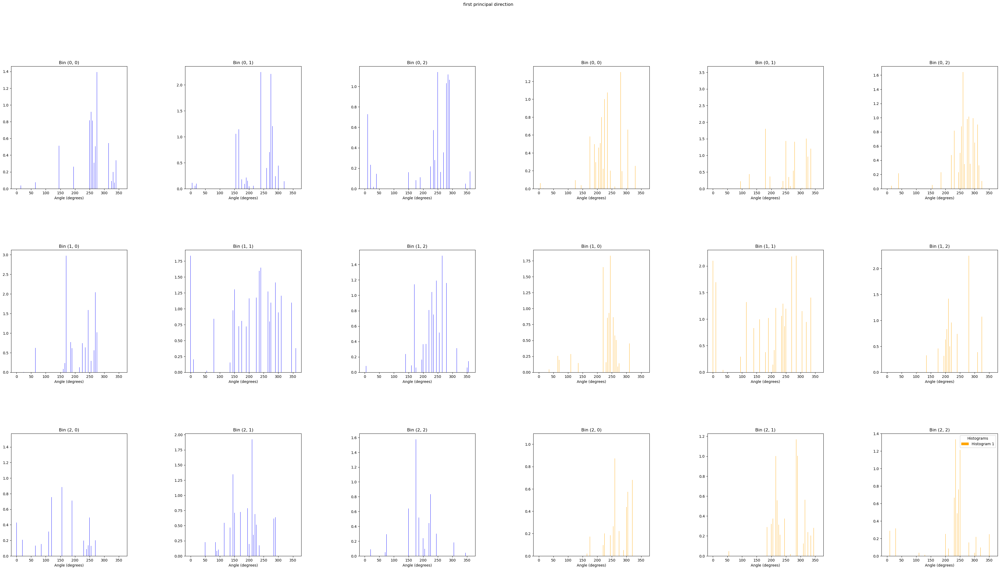

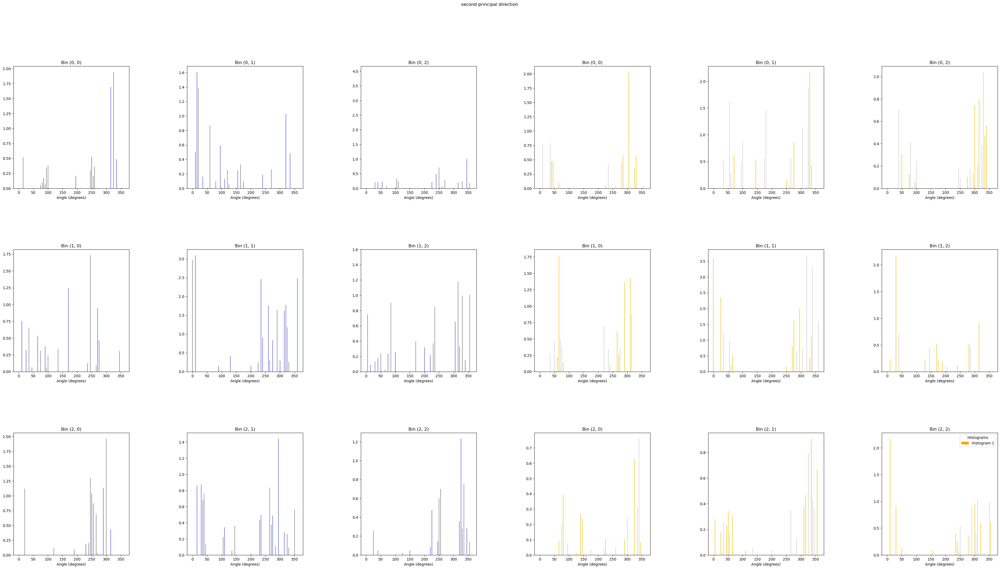

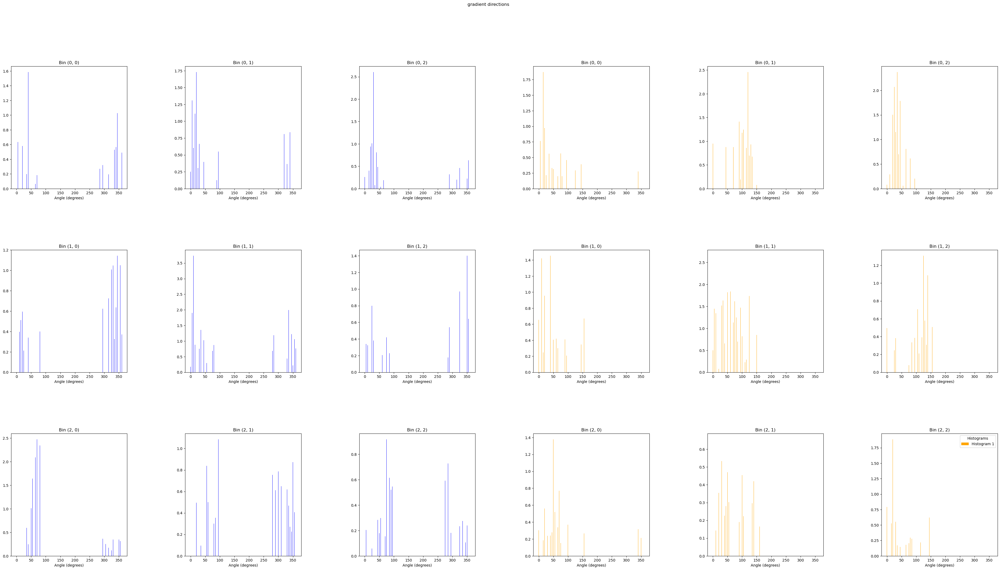

In [44]:
# compute descriptor again
positions = [
    np.round(chosen_kps[0].pt).astype(int),
    np.round(chosen_kps[1].pt).astype(int),
]
descriptor_histograms = [
    desc.compute_descriptor_histograms_1_2_rotated(
        obj_features[i],
        kp_position=positions[i],
        nb_bins=nb_bins,
        bin_radius=bin_radius,
        delta_angle=delta_angle,
        sigma=sigma_weight,
        normalization_mode=normalization_mode,
    )
    for i in range(2)
]
values_names = [
    "first principal direction",
    "second principal direction",
    "gradient directions",
]

for id_feature in range(3):
    visu_desc.display_matched_histograms(
        hist1=descriptor_histograms[0][id_feature],
        hist2=descriptor_histograms[1][id_feature],
        hist_title=values_names[id_feature],
    )

In [45]:
positions

[array([410, 250]), array([961, 503])]

_Observations:_

- for keypoints (410, 250) & (961, 503), they clearly don't represent the same real point but do have similarities in their descriptors
